### Temperature Forecast Project

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime

In [2]:
data = pd.read_csv("https://raw.githubusercontent.com/dsrscientist/Dataset2/main/temperature.csv")

In [3]:
# pd.set_option("display.max_rows", None)
data

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.000000,0.000000,0.000000,37.6046,126.991,212.3350,2.785000,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.000000,0.000000,0.000000,37.6046,127.032,44.7624,0.514100,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.000000,0.000000,0.000000,37.5776,127.058,33.3068,0.266100,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.000000,0.000000,0.000000,37.6450,127.022,45.7160,2.534800,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.000000,0.000000,0.000000,37.5507,127.135,35.0380,0.505500,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,23.0,30-08-2017,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,30-08-2017,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,30-08-2017,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,...,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,NaN,NaN,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3


In [4]:
data.dtypes

station             float64
Date                 object
Present_Tmax        float64
Present_Tmin        float64
LDAPS_RHmin         float64
LDAPS_RHmax         float64
LDAPS_Tmax_lapse    float64
LDAPS_Tmin_lapse    float64
LDAPS_WS            float64
LDAPS_LH            float64
LDAPS_CC1           float64
LDAPS_CC2           float64
LDAPS_CC3           float64
LDAPS_CC4           float64
LDAPS_PPT1          float64
LDAPS_PPT2          float64
LDAPS_PPT3          float64
LDAPS_PPT4          float64
lat                 float64
lon                 float64
DEM                 float64
Slope               float64
Solar radiation     float64
Next_Tmax           float64
Next_Tmin           float64
dtype: object

In [5]:
data.columns

Index(['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin'],
      dtype='object')

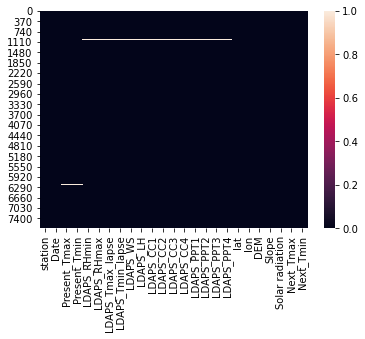

In [6]:
sns.heatmap(data.isnull())

In [7]:
data.shape

(7752, 25)

In [8]:
data.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [9]:
#Null values in almost all columns

In [10]:
#we can drop the null date rows as well as null station rows(last two rows)
data.drop(data.tail(2).index,inplace=True) 

In [11]:
data.isnull().sum()

station              0
Date                 0
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [12]:
#convert the type of Date column from object to python date
data.Date = data['Date'].apply(lambda x: datetime.strptime(x, '%d-%m-%Y'))

In [13]:
#grouping by date to find the mean values by date
grp = data.groupby(by='Date').mean()

In [14]:
grp[np.isnan(grp.LDAPS_RHmin)]

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
Date,,,,,,,,,,,,,,,,,,,,,
2013-08-10,13.0,29.420,25.744,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,37.54472,126.9914,61.854944,1.256692,5162.939024,34.156,23.928
2016-07-31,13.0,32.712,25.948,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,37.54472,126.9914,61.854944,1.256692,5405.879199,32.412,25.140
2016-08-20,13.0,33.688,26.940,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,37.54472,126.9914,61.854944,1.256692,4801.788164,35.708,26.480


In [15]:
#replacing the null values by replacing the mean values of that particular day
it = 0
p_tmax = []
p_tmin = []
LDAPS_RHmin = []
LDAPS_RHmax = []
LDAPS_Tmax_lapse = []
LDAPS_Tmin_lapse = []
LDAPS_WS = []
LDAPS_LH = []
LDAPS_cc1 = []
LDAPS_cc2 = []
LDAPS_cc3 = []
LDAPS_cc4 = []
LDAPS_PPT1 = []
LDAPS_PPT2 = []
LDAPS_PPT3 = []
LDAPS_PPT4 = []
for index, row in data.iterrows():
    if np.isnan(row['Present_Tmax']):
        p_tmax.append(grp["Present_Tmax"][it])
    else:
        p_tmax.append(row["Present_Tmax"])
    if np.isnan(row['Present_Tmin']):
        p_tmin.append(grp["Present_Tmin"][it])
    else:
        p_tmin.append(row["Present_Tmin"])
    if np.isnan(row['LDAPS_RHmin']):
        if np.isnan(grp['LDAPS_RHmin'][it]):
            LDAPS_RHmin.append(data.LDAPS_RHmin.median())
        else:
            LDAPS_RHmin.append(grp["LDAPS_RHmin"][it])
    else:
        LDAPS_RHmin.append(row["LDAPS_RHmin"])
        
    if np.isnan(row['LDAPS_RHmax']):
        if np.isnan(grp['LDAPS_RHmax'][it]):
            LDAPS_RHmax.append(data.LDAPS_RHmax.median())
        else:
            LDAPS_RHmax.append(grp["LDAPS_RHmax"][it])
    else:
        LDAPS_RHmax.append(row["LDAPS_RHmax"])
        
    if np.isnan(row['LDAPS_Tmax_lapse']):
        if np.isnan(grp['LDAPS_Tmax_lapse'][it]):
            LDAPS_Tmax_lapse.append(data.LDAPS_Tmax_lapse.median())
        else:
            LDAPS_Tmax_lapse.append(grp["LDAPS_Tmax_lapse"][it])
    else:
        LDAPS_Tmax_lapse.append(row["LDAPS_Tmax_lapse"])
        
    if np.isnan(row['LDAPS_Tmin_lapse']):
        if np.isnan(grp['LDAPS_Tmin_lapse'][it]):
            LDAPS_Tmin_lapse.append(data.LDAPS_Tmin_lapse.median())
        else:
            LDAPS_Tmin_lapse.append(grp["LDAPS_Tmin_lapse"][it])
    else:
        LDAPS_Tmin_lapse.append(row["LDAPS_Tmin_lapse"])
        
    if np.isnan(row['LDAPS_WS']):
        if np.isnan(grp['LDAPS_WS'][it]):
            LDAPS_WS.append(data.LDAPS_WS.median())
        else:
            LDAPS_WS.append(grp["LDAPS_WS"][it])
    else:
        LDAPS_WS.append(row["LDAPS_WS"])
        
    if np.isnan(row['LDAPS_LH']):
        if np.isnan(grp['LDAPS_LH'][it]):
            LDAPS_LH.append(data.LDAPS_LH.median())
        else:
            LDAPS_LH.append(grp["LDAPS_LH"][it])
    else:
        LDAPS_LH.append(row["LDAPS_LH"])
        
    if np.isnan(row['LDAPS_CC1']):
        if np.isnan(grp['LDAPS_CC1'][it]):
            LDAPS_cc1.append(data.LDAPS_CC1.median())
        else:
            LDAPS_cc1.append(grp["LDAPS_CC1"][it])
    else:
        LDAPS_cc1.append(row["LDAPS_CC1"])
        
    if np.isnan(row['LDAPS_CC2']):
        if np.isnan(grp['LDAPS_CC2'][it]):
            LDAPS_cc2.append(data.LDAPS_CC2.median())
        else:
            LDAPS_cc2.append(grp["LDAPS_CC2"][it])
    else:
        LDAPS_cc2.append(row["LDAPS_CC2"])
        
    if np.isnan(row['LDAPS_CC3']):
        if np.isnan(grp['LDAPS_CC3'][it]):
            LDAPS_cc3.append(data.LDAPS_CC3.median())
        else:
            LDAPS_cc3.append(grp["LDAPS_CC3"][it])
    else:
        LDAPS_cc3.append(row["LDAPS_CC3"])
        
    if np.isnan(row['LDAPS_CC4']):
        if np.isnan(grp['LDAPS_CC4'][it]):
            LDAPS_cc4.append(data.LDAPS_CC4.median())
        else:
            LDAPS_cc4.append(grp["LDAPS_CC4"][it])
    else:
        LDAPS_cc4.append(row["LDAPS_CC4"])
        
    if np.isnan(row['LDAPS_PPT1']):
        if np.isnan(grp['LDAPS_PPT1'][it]):
            LDAPS_PPT1.append(data.LDAPS_PPT1.median())
        else:
            LDAPS_PPT1.append(grp["LDAPS_PPT1"][it])
    else:
        LDAPS_PPT1.append(row["LDAPS_PPT1"])
        
    if np.isnan(row['LDAPS_PPT2']):
        if np.isnan(grp['LDAPS_PPT2'][it]):
            LDAPS_PPT2.append(data.LDAPS_PPT2.median())
        else:
            LDAPS_PPT2.append(grp["LDAPS_PPT2"][it])
    else:
        LDAPS_PPT2.append(row["LDAPS_PPT2"])
        
    if np.isnan(row['LDAPS_PPT3']):
        if np.isnan(grp['LDAPS_PPT3'][it]):
            LDAPS_PPT3.append(data.LDAPS_PPT3.median())
        else:
            LDAPS_PPT3.append(grp["LDAPS_PPT3"][it])
    else:
        LDAPS_PPT3.append(row["LDAPS_PPT3"])
    if np.isnan(row['LDAPS_PPT4']): 
        if np.isnan(grp['LDAPS_PPT4'][it]):
            LDAPS_PPT4.append(data.LDAPS_PPT4.median())
        else:
            LDAPS_PPT4.append(grp["LDAPS_PPT4"][it])
    else:
        LDAPS_PPT4.append(row["LDAPS_PPT4"])
    
    if row["station"] == 25:
        it = it + 1
data["Present_Tmax"] = p_tmax
data["Present_Tmin"] = p_tmin
data["LDAPS_RHmin"] = LDAPS_RHmin
data["LDAPS_RHmax"] = LDAPS_RHmax
data["LDAPS_Tmax_lapse"] = LDAPS_Tmax_lapse
data["LDAPS_Tmin_lapse"] = LDAPS_Tmin_lapse
data["LDAPS_WS"] = LDAPS_WS
data["LDAPS_LH"] = LDAPS_LH
data["LDAPS_CC1"] = LDAPS_cc1
data["LDAPS_CC2"] = LDAPS_cc2
data["LDAPS_CC3"] = LDAPS_cc3
data["LDAPS_CC4"] = LDAPS_cc4
data["LDAPS_PPT1"] = LDAPS_PPT1
data["LDAPS_PPT2"] = LDAPS_PPT2
data["LDAPS_PPT3"] = LDAPS_PPT3
data["LDAPS_PPT4"] = LDAPS_PPT4
# print(LDAPS_RHmax)

In [16]:
#Droping the rows where target value is null
data.dropna(inplace=True)

In [17]:
data.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,2013-06-30,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,2013-06-30,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,2013-06-30,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,2013-06-30,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,2013-06-30,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


In [18]:
#Creating new columns day and month from the date column and drop the date column
data['day'] = data['Date'].apply(lambda x: x.date().day)
data['month'] = data['Date'].apply(lambda x: x.date().month)
data.drop("Date", axis=1,inplace=True)
#we can drop station column also since station is a physical pointed which can also be described by
#lat and long(which is already in the dataset)
data.drop("station",inplace=True, axis=1)

In [19]:

data.head()

,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,...,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,day,month
0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,...,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2,30,6
1,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,...,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5,30,6
2,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,...,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9,30,6
3,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,...,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3,30,6
4,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,...,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5,30,6


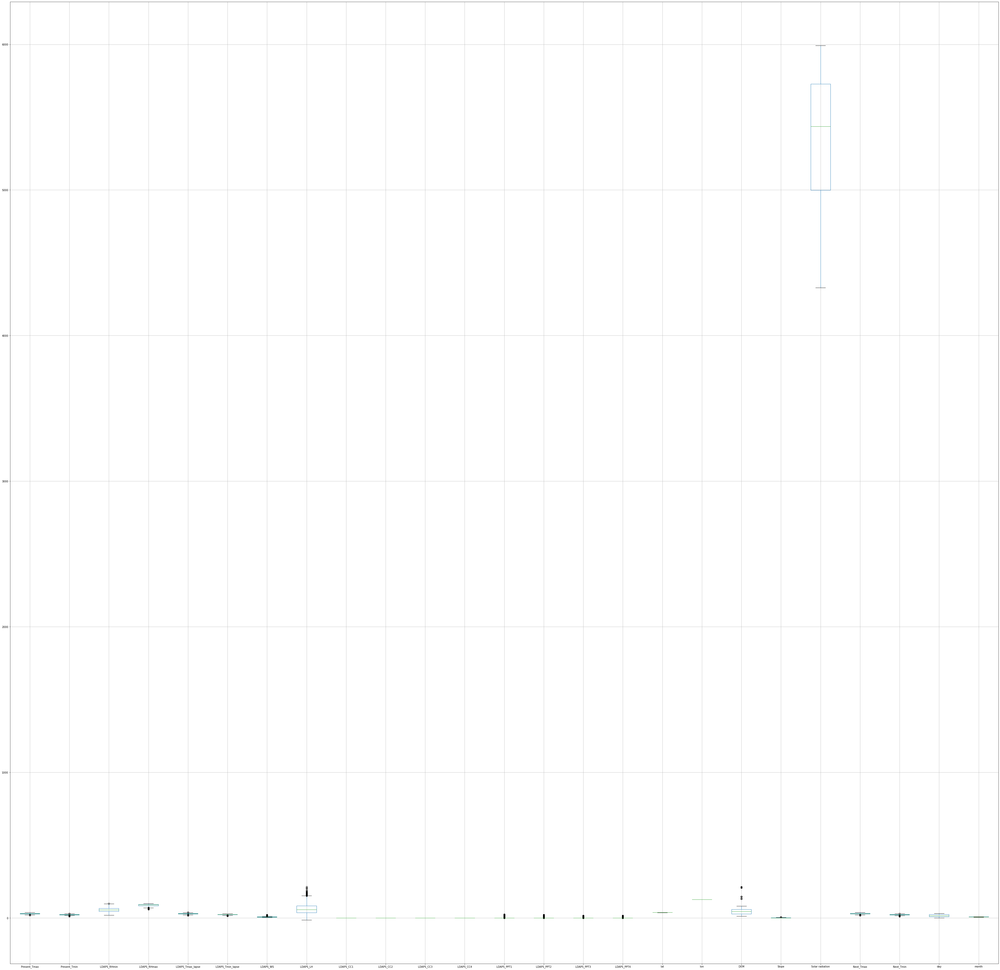

In [20]:
plt.figure(figsize=(70,70))
data.boxplot()

In [21]:
#There are outliers in columns such as LDAPS_LH

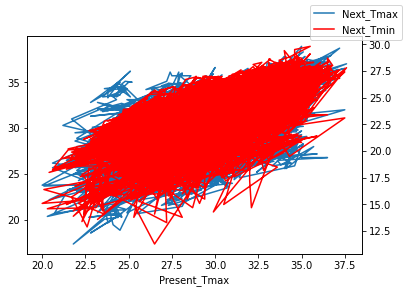

In [22]:
ax = data.plot(x="Present_Tmax", y="Next_Tmax", legend=False)
ax2 = ax.twinx()
data.plot(x="Present_Tmax", y="Next_Tmin", ax=ax2, legend=False, color="r")
ax.figure.legend()
plt.show()

In [23]:
#no any obvious relationship

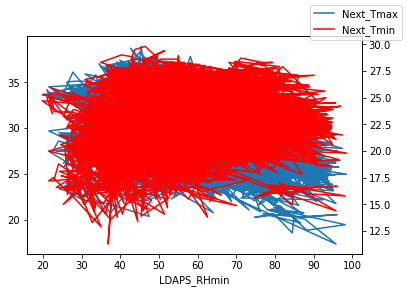

In [24]:
ax = data.plot(x="LDAPS_RHmin", y="Next_Tmax", legend=False)
ax2 = ax.twinx()
data.plot(x="LDAPS_RHmin", y="Next_Tmin", ax=ax2, legend=False, color="r")
ax.figure.legend()
plt.show()

In [25]:
#can't find any kind of relatioship at the first glance

In [26]:
cor = data.corr()

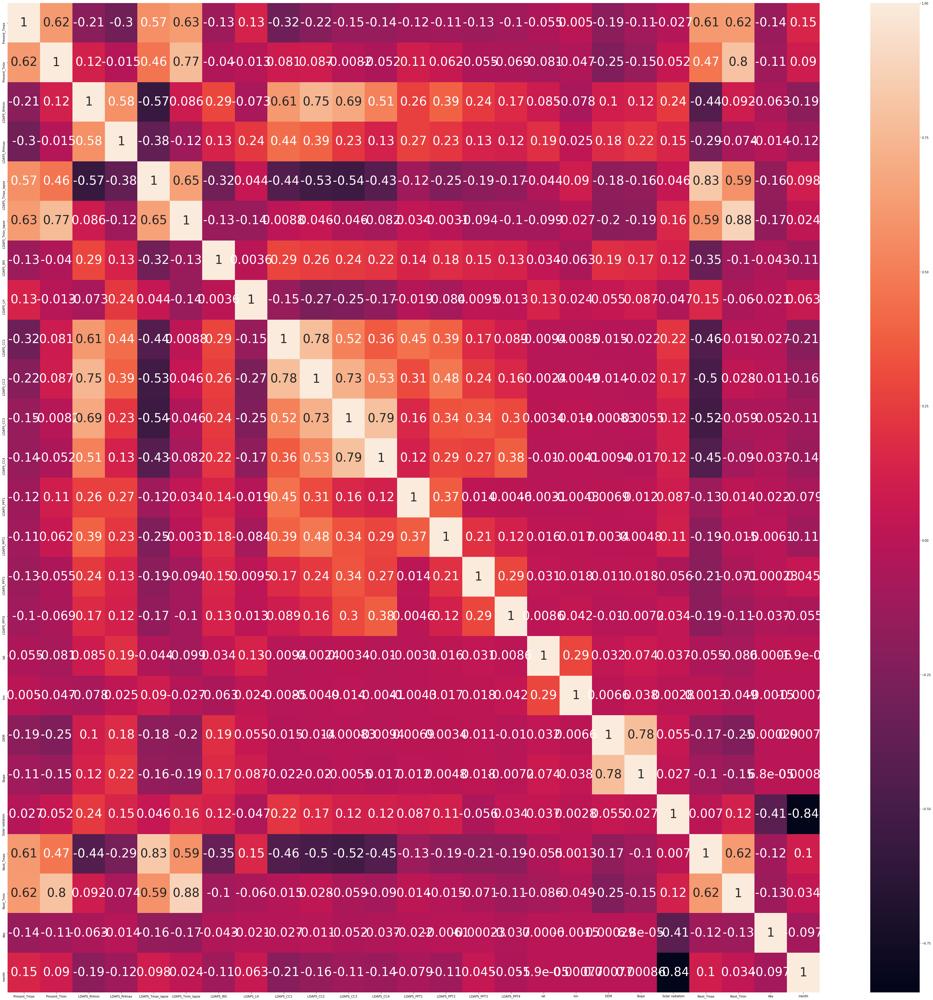

In [27]:
plt.figure(figsize=(60,60))
sns.heatmap(cor, annot=True, annot_kws={"fontsize":40})

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


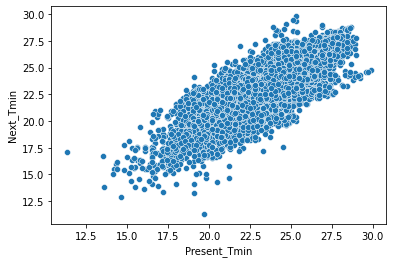

In [28]:
sns.scatterplot(data.Present_Tmin, data.Next_Tmin)

In [29]:
#present tmin and next tmin are positively correlated

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


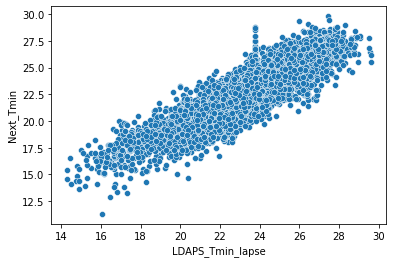

In [30]:
sns.scatterplot(data.LDAPS_Tmin_lapse, data.Next_Tmin)

In [31]:
data.head()

,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,...,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,day,month
0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,...,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2,30,6
1,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,...,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5,30,6
2,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,...,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9,30,6
3,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,...,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3,30,6
4,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,...,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5,30,6


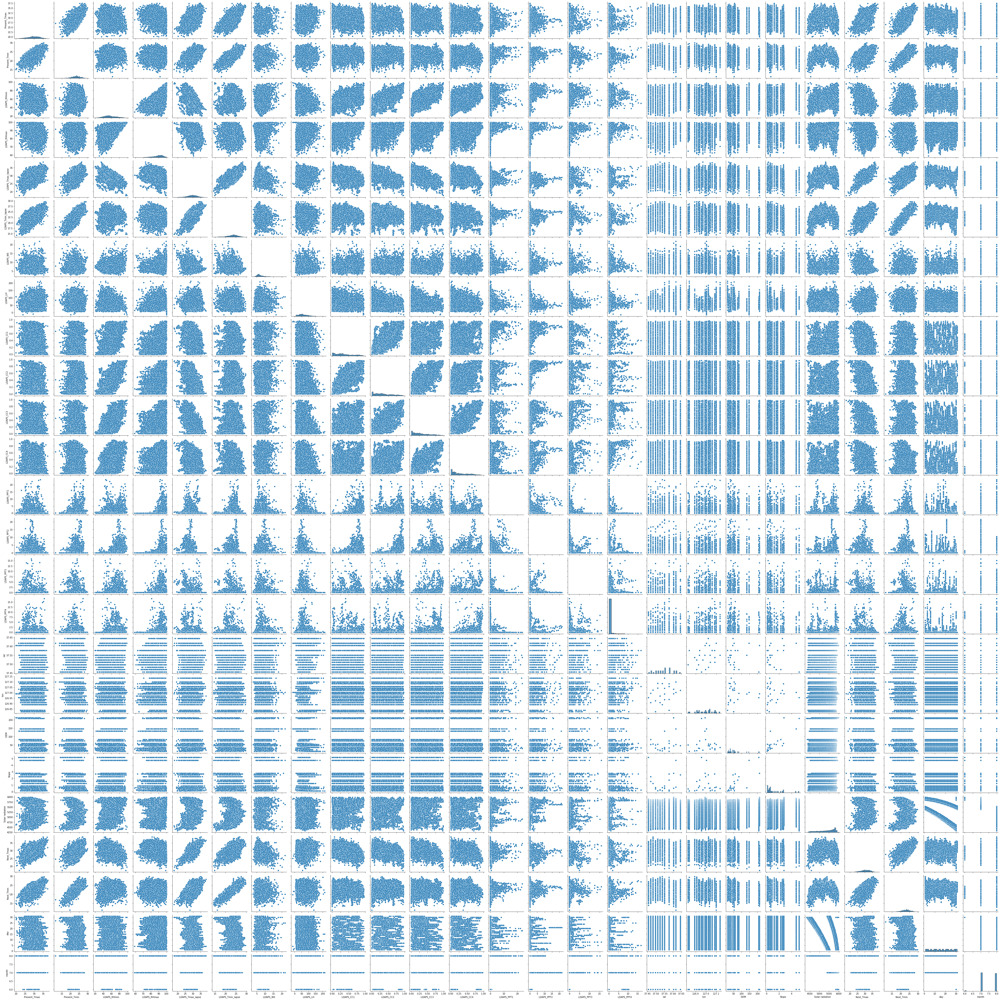

In [32]:
sns.pairplot(data)

In [33]:
data.skew()

Present_Tmax       -0.261406
Present_Tmin       -0.355202
LDAPS_RHmin         0.306334
LDAPS_RHmax        -0.854978
LDAPS_Tmax_lapse   -0.224601
LDAPS_Tmin_lapse   -0.580895
LDAPS_WS            1.564337
LDAPS_LH            0.671394
LDAPS_CC1           0.465858
LDAPS_CC2           0.479545
LDAPS_CC3           0.647540
LDAPS_CC4           0.672879
LDAPS_PPT1          5.331180
LDAPS_PPT2          5.722065
LDAPS_PPT3          6.381043
LDAPS_PPT4          6.753010
lat                 0.086467
lon                -0.286647
DEM                 1.721745
Slope               1.560876
Solar radiation    -0.513584
Next_Tmax          -0.335372
Next_Tmin          -0.396184
day                -0.008981
month              -0.193597
dtype: float64

In [34]:
#removing skewness
from sklearn.preprocessing import PowerTransformer
cols = ["LDAPS_WS", "LDAPS_LH", "LDAPS_CC3", "LDAPS_CC4", "LDAPS_PPT1", "LDAPS_PPT2"
       ,"LDAPS_PPT3", "LDAPS_PPT4", "DEM", "Slope", "Solar radiation"]
for i in cols:
    pt = PowerTransformer()
    pt.fit(np.array(data[i]).reshape(-1, 1))
    data[i] = pt.transform(np.array(data[i]).reshape(-1, 1))

In [35]:
pt = PowerTransformer()
pt.fit(np.array(data["LDAPS_PPT3"]).reshape(-1, 1))
data["LDAPS_PPT3"] = pt.transform(np.array(data["LDAPS_PPT3"]).reshape(-1, 1))
pt = PowerTransformer()
pt.fit(np.array(data["LDAPS_PPT4"]).reshape(-1, 1))
data["LDAPS_PPT4"] = pt.transform(np.array(data["LDAPS_PPT4"]).reshape(-1, 1))

In [36]:
data.skew()

Present_Tmax       -0.261406
Present_Tmin       -0.355202
LDAPS_RHmin         0.306334
LDAPS_RHmax        -0.854978
LDAPS_Tmax_lapse   -0.224601
LDAPS_Tmin_lapse   -0.580895
LDAPS_WS            0.004032
LDAPS_LH            0.030927
LDAPS_CC1           0.465858
LDAPS_CC2           0.479545
LDAPS_CC3           0.089548
LDAPS_CC4           0.129424
LDAPS_PPT1          1.465674
LDAPS_PPT2          1.647898
LDAPS_PPT3          1.265525
LDAPS_PPT4          1.500580
lat                 0.086467
lon                -0.286647
DEM                 0.039614
Slope               0.233757
Solar radiation    -0.177661
Next_Tmax          -0.335372
Next_Tmin          -0.396184
day                -0.008981
month              -0.193597
dtype: float64

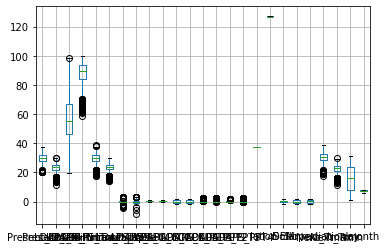

In [37]:
data.boxplot()

In [38]:
from scipy.stats import zscore
zs = np.abs(zscore(data))

In [39]:
#removing outliers
new_data = data[(zs < 3).all(axis=1)]

In [40]:
new_data.shape

(7542, 25)

In [41]:
data.shape

(7723, 25)

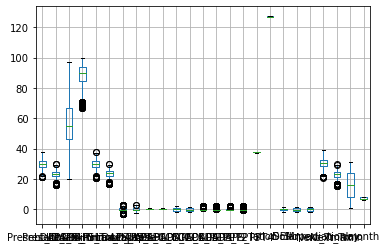

In [42]:
new_data.boxplot()

In [54]:
y = new_data[["Next_Tmax", "Next_Tmin"]]

In [55]:
x = new_data.drop(["Next_Tmax", "Next_Tmin"], axis=1)

In [57]:
y

,Next_Tmax,Next_Tmin
0,29.1,21.2
1,30.5,22.5
2,31.1,23.9
3,31.7,24.3
4,31.2,22.5
...,...,...
7745,27.6,17.7
7746,28.0,17.1
7747,28.3,18.1
7748,28.6,18.8


In [58]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import Ridge
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score

In [62]:
#finding best random state
max_acc = 0
max_rs = 0
for i in range(1,200):
    x_train, x_test, y_train, y_test = train_test_split(x,y,test_size = .22, random_state = i)
    lr = LinearRegression()
    lr.fit(x_train, y_train)
    pred = lr.predict(x_test)
    r2 = r2_score(y_test, pred)
    if r2 > max_acc:
        max_acc = r2
        max_rs = i
print("Best random state=",max_rs)

Best random state= 0.8043798301057851


In [60]:
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size = .22, random_state = 149)

In [63]:
models = {"KNN":KNeighborsRegressor(), "RandomForest":RandomForestRegressor(),"LinearRegression":LinearRegression(), "Ridge":Ridge(), "dtr":DecisionTreeRegressor() }
acc = {}
mod_list = []
for i in models:
    mod = i
    mod = models[i]
    #mod = DecisionTreeRegressor()
    mod.fit(x_train, y_train)
    pred = mod.predict(x_test)
    r2_sc = r2_score(y_test,pred)
    acc[i] = r2_sc
    mod_list.append(mod)
print(acc)

{'KNN': 0.8599730194642828, 'RandomForest': 0.8995941563774946, 'LinearRegression': 0.7853175794538507, 'Ridge': 0.7853127766072545, 'dtr': 0.7783570926231476}


In [64]:
#applying cross validation
from sklearn.model_selection import cross_val_score

In [65]:
cv_list = {}
for i in mod_list:
    cv = cross_val_score(i, x, y, cv=7)
    cv_list[str(i)] = cv.mean()
print(cv_list)

{'KNeighborsRegressor()': 0.48787247761856534, 'RandomForestRegressor()': 0.6941452064755522, 'LinearRegression()': 0.7144723514899306, 'Ridge()': 0.7146617238594948, 'DecisionTreeRegressor()': 0.3856807336888875}


In [66]:
#Linear regression is the best model

In [70]:
#hyperparameter tuning
from sklearn.model_selection import GridSearchCV

In [71]:
param_grid = {  'fit_intercept': [True, False],
              'normalize': [True, False],
              'copy_X': [True, False],}

In [72]:
GCV = GridSearchCV(LinearRegression(),param_grid=param_grid, cv=7)

In [73]:
GCV.fit(x_train, y_train)

GridSearchCV(cv=7, estimator=LinearRegression(),
             param_grid={'copy_X': [True, False],
                         'fit_intercept': [True, False],
                         'normalize': [True, False]})

In [74]:
GCV.best_params_

{'copy_X': True, 'fit_intercept': True, 'normalize': False}

In [75]:
GCV_predict = GCV.best_estimator_.predict(x_test)

In [76]:
r2_score(y_test, GCV_predict)

0.7853175794538507

In [78]:
#saving model
import joblib
joblib.dump(GCV.best_estimator_, "Temperature.obj")

['Temperature.obj']